In [59]:
# Импортируем библиотеки, которые могут нам понадобится в работе
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
plt.style.use('default')
import seaborn as sns
import matplotlib as mpl

In [60]:
covid_data = pd.read_csv('covid_data.csv')
display(covid_data.head())

,date,province/state,country,confirmed,deaths,recovered
0,01/22/2020,Anhui,China,1.0,0.0,0.0
1,01/22/2020,Beijing,China,14.0,0.0,0.0
2,01/22/2020,Chongqing,China,6.0,0.0,0.0
3,01/22/2020,Fujian,China,1.0,0.0,0.0
4,01/22/2020,Gansu,China,0.0,0.0,0.0


In [61]:
vaccinations_data = pd.read_csv('country_vaccinations.csv')
vaccinations_data = vaccinations_data[
        ['country', 'date', 'total_vaccinations', 
         'people_vaccinated', 'people_vaccinated_per_hundred',
         'people_fully_vaccinated', 'people_fully_vaccinated_per_hundred',
         'daily_vaccinations', 'vaccines']
    ]
display(vaccinations_data.head())

,country,date,total_vaccinations,people_vaccinated,people_vaccinated_per_hundred,people_fully_vaccinated,people_fully_vaccinated_per_hundred,daily_vaccinations,vaccines
0,Afghanistan,2021-02-22,0.0,0.0,0.0,NaN,NaN,NaN,"Johnson&Johnson, Oxford/AstraZeneca, Pfizer/Bi..."
1,Afghanistan,2021-02-23,NaN,NaN,NaN,NaN,NaN,1367.0,"Johnson&Johnson, Oxford/AstraZeneca, Pfizer/Bi..."
2,Afghanistan,2021-02-24,NaN,NaN,NaN,NaN,NaN,1367.0,"Johnson&Johnson, Oxford/AstraZeneca, Pfizer/Bi..."
3,Afghanistan,2021-02-25,NaN,NaN,NaN,NaN,NaN,1367.0,"Johnson&Johnson, Oxford/AstraZeneca, Pfizer/Bi..."
4,Afghanistan,2021-02-26,NaN,NaN,NaN,NaN,NaN,1367.0,"Johnson&Johnson, Oxford/AstraZeneca, Pfizer/Bi..."


In [62]:
covid_data = covid_data.groupby(
        ['date', 'country'], 
        as_index=False
    )[['confirmed', 'deaths', 'recovered']].sum()

In [63]:
covid_data['date'] = pd.to_datetime(covid_data['date'])

In [64]:
covid_data['active'] = covid_data['confirmed'] - covid_data['deaths'] - covid_data['recovered']

In [65]:
covid_data = covid_data.sort_values(by=['country', 'date'])
covid_data['daily_confirmed'] = covid_data.groupby('country')['confirmed'].diff()
covid_data['daily_deaths'] = covid_data.groupby('country')['deaths'].diff()
covid_data['daily_recovered'] = covid_data.groupby('country')['recovered'].diff()
display(covid_data.head())

,date,country,confirmed,deaths,recovered,active,daily_confirmed,daily_deaths,daily_recovered
11337,2020-02-24,Afghanistan,1.0,0.0,0.0,1.0,NaN,NaN,NaN
11570,2020-02-25,Afghanistan,1.0,0.0,0.0,1.0,0.0,0.0,0.0
11807,2020-02-26,Afghanistan,1.0,0.0,0.0,1.0,0.0,0.0,0.0
12051,2020-02-27,Afghanistan,1.0,0.0,0.0,1.0,0.0,0.0,0.0
12299,2020-02-28,Afghanistan,1.0,0.0,0.0,1.0,0.0,0.0,0.0


In [66]:
vaccinations_data['date'] = pd.to_datetime(vaccinations_data['date'])

In [67]:
print(covid_data.min())

date               2020-01-22 00:00:00
country                    Afghanistan
confirmed                          0.0
deaths                             0.0
recovered                          0.0
active                        -19556.0
daily_confirmed              -348667.0
daily_deaths                   -5337.0
daily_recovered             -6399531.0
dtype: object


In [68]:
print(covid_data.max())

date                          2021-05-29 00:00:00
country            occupied Palestinian territory
confirmed                              33251939.0
deaths                                   594306.0
recovered                              25454320.0
active                                 32657633.0
daily_confirmed                          823225.0
daily_deaths                               4561.0
daily_recovered                         1123456.0
dtype: object


In [69]:
print(vaccinations_data['date'].max())

2021-09-06 00:00:00


In [70]:
print(vaccinations_data['date'].min())

2020-12-02 00:00:00


In [71]:
start_date = '2020-01-22'
end_date = '2021-05-29'
covid_data_filtered = covid_data[(covid_data['date'] >= start_date) & (covid_data['date'] <= end_date)]
covid_df = pd.merge(covid_data_filtered, vaccinations_data, on=['country', 'date'], how='left')
display(covid_df.head())

,date,country,confirmed,deaths,recovered,active,daily_confirmed,daily_deaths,daily_recovered,total_vaccinations,people_vaccinated,people_vaccinated_per_hundred,people_fully_vaccinated,people_fully_vaccinated_per_hundred,daily_vaccinations,vaccines
0,2020-02-24,Afghanistan,1.0,0.0,0.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2020-02-25,Afghanistan,1.0,0.0,0.0,1.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2020-02-26,Afghanistan,1.0,0.0,0.0,1.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2020-02-27,Afghanistan,1.0,0.0,0.0,1.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2020-02-28,Afghanistan,1.0,0.0,0.0,1.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [72]:
output_file = 'covid_data_with_vaccinations.csv'

# Сохранение DataFrame в CSV файл
covid_df.to_csv(output_file, index=False)

print(f"Таблица успешно сохранена в файл: {output_file}")

Таблица успешно сохранена в файл: covid_data_with_vaccinations.csv


In [73]:
covid_df.shape

(86785, 16)

In [74]:
# Рассчитываем death_rate и recover_rate
covid_df['death_rate'] = (covid_df['deaths'] / covid_df['confirmed'].replace(0, pd.NA)) * 100
covid_df['recover_rate'] = (covid_df['recovered'] / covid_df['confirmed'].replace(0, pd.NA)) * 100

# Заменяем NaN на 0, если это необходимо для удобства
covid_df['death_rate'] = covid_df['death_rate'].fillna(0)
covid_df['recover_rate'] = covid_df['recover_rate'].fillna(0)

# Проверяем результат
print(covid_df[['date', 'country', 'confirmed', 'deaths', 'recovered', 'death_rate', 'recover_rate']])

            date                         country  confirmed  deaths  \
0     2020-02-24                     Afghanistan        1.0     0.0   
1     2020-02-25                     Afghanistan        1.0     0.0   
2     2020-02-26                     Afghanistan        1.0     0.0   
3     2020-02-27                     Afghanistan        1.0     0.0   
4     2020-02-28                     Afghanistan        1.0     0.0   
...          ...                             ...        ...     ...   
86780 2020-03-12  occupied Palestinian territory        0.0     0.0   
86781 2020-03-14  occupied Palestinian territory        0.0     0.0   
86782 2020-03-15  occupied Palestinian territory        0.0     0.0   
86783 2020-03-16  occupied Palestinian territory        0.0     0.0   
86784 2020-03-17  occupied Palestinian territory        0.0     0.0   

       recovered  death_rate  recover_rate  
0            0.0         0.0           0.0  
1            0.0         0.0           0.0  
2           

C:\Users\yuryb\AppData\Local\Temp\ipykernel_17648\1757711362.py:6: FutureWarning:

Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`

C:\Users\yuryb\AppData\Local\Temp\ipykernel_17648\1757711362.py:7: FutureWarning:

Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`



In [75]:
# Фильтруем данные для Соединенных Штатов
usa_data = covid_df[covid_df['country'] == 'United States']

# Находим максимальное значение death_rate для США и округляем до 2 знаков после запятой
max_death_rate_usa = usa_data['death_rate'].max().round(2)

# Выводим результат
print(max_death_rate_usa)

7.19


In [76]:
# Фильтруем данные для России
russia_data = covid_df[covid_df['country'] == 'Russia']

# Находим максимальное значение death_rate для США и округляем до 2 знаков после запятой
recover_rate_russia = russia_data['recover_rate'].mean().round(2)

# Выводим результат
print(recover_rate_russia)

67.06


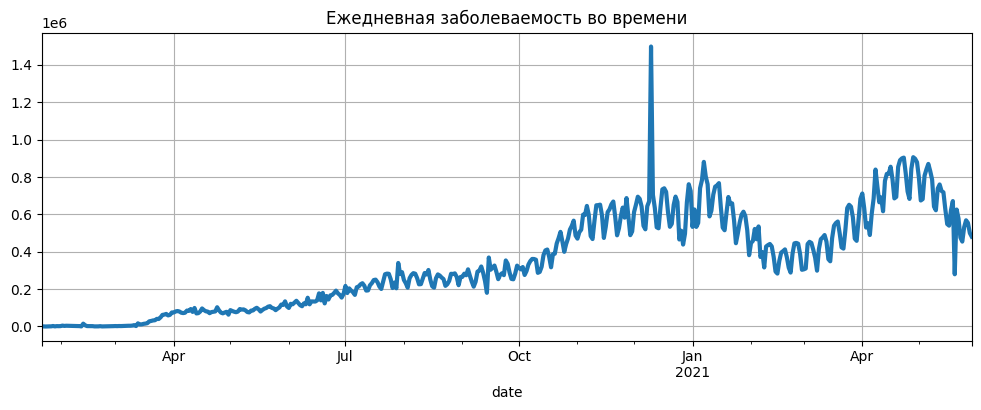

In [77]:
grouped_cases = covid_df.groupby('date')['daily_confirmed'].sum()
grouped_cases.plot(
        kind='line',
        figsize=(12, 4),
        title='Ежедневная заболеваемость во времени',
        grid = True,
        lw=3
    );

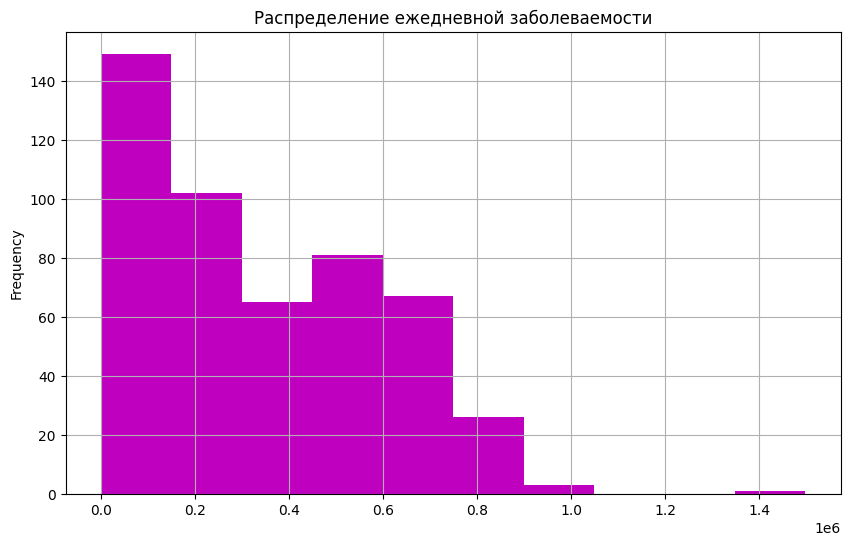

In [78]:
grouped_cases.plot(
        kind='hist',
        figsize=(10, 6),
        title='Распределение ежедневной заболеваемости',
        grid = True,
        color = 'm',
        bins=10
    );

In [79]:
from matplotlib import colormaps
list(colormaps)

['magma',
 'inferno',
 'plasma',
 'viridis',
 'cividis',
 'twilight',
 'twilight_shifted',
 'turbo',
 'berlin',
 'managua',
 'vanimo',
 'Blues',
 'BrBG',
 'BuGn',
 'BuPu',
 'CMRmap',
 'GnBu',
 'Greens',
 'Greys',
 'OrRd',
 'Oranges',
 'PRGn',
 'PiYG',
 'PuBu',
 'PuBuGn',
 'PuOr',
 'PuRd',
 'Purples',
 'RdBu',
 'RdGy',
 'RdPu',
 'RdYlBu',
 'RdYlGn',
 'Reds',
 'Spectral',
 'Wistia',
 'YlGn',
 'YlGnBu',
 'YlOrBr',
 'YlOrRd',
 'afmhot',
 'autumn',
 'binary',
 'bone',
 'brg',
 'bwr',
 'cool',
 'coolwarm',
 'copper',
 'cubehelix',
 'flag',
 'gist_earth',
 'gist_gray',
 'gist_heat',
 'gist_ncar',
 'gist_rainbow',
 'gist_stern',
 'gist_yarg',
 'gnuplot',
 'gnuplot2',
 'gray',
 'hot',
 'hsv',
 'jet',
 'nipy_spectral',
 'ocean',
 'pink',
 'prism',
 'rainbow',
 'seismic',
 'spring',
 'summer',
 'terrain',
 'winter',
 'Accent',
 'Dark2',
 'Paired',
 'Pastel1',
 'Pastel2',
 'Set1',
 'Set2',
 'Set3',
 'tab10',
 'tab20',
 'tab20b',
 'tab20c',
 'grey',
 'gist_grey',
 'gist_yerg',
 'Grays',
 'magma_r',

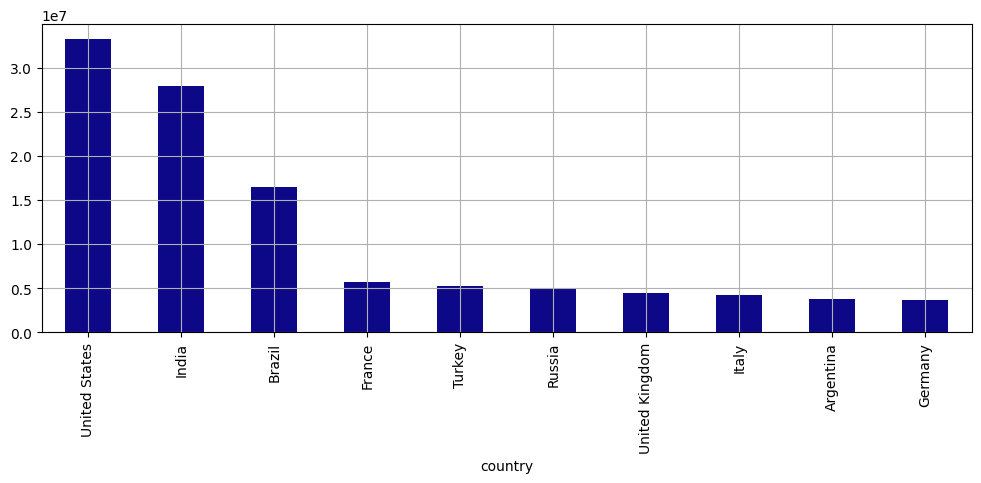

In [80]:
grouped_country = covid_df.groupby(['country'])['confirmed'].last()
grouped_country = grouped_country.nlargest(10)
grouped_country.plot(
        kind='bar',
        grid=True,
        figsize=(12, 4),
        colormap='plasma'
    );

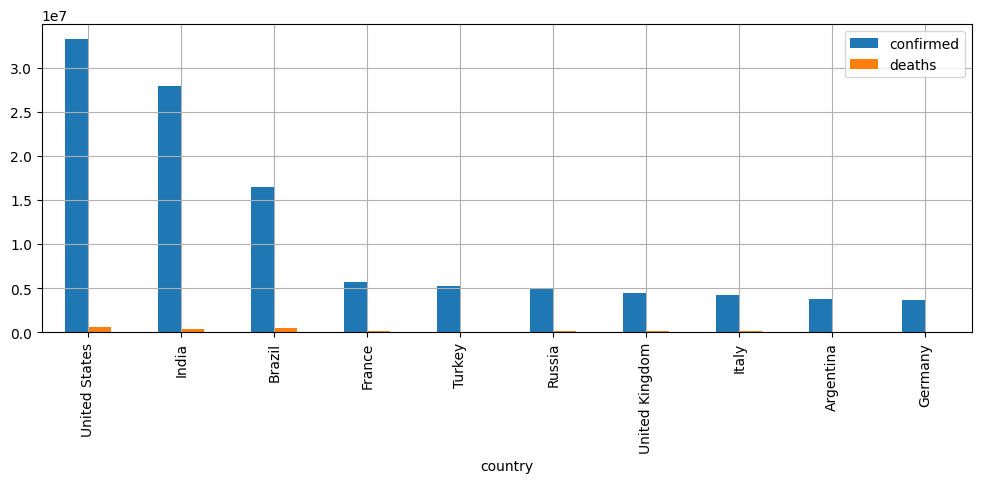

In [81]:
grouped_country = covid_df.groupby(['country'])[['confirmed', 'deaths']].last()
grouped_country = grouped_country.nlargest(10, columns=['confirmed'])
grouped_country.plot(     kind='bar',     grid=True,     figsize=(12, 4), );

<Axes: xlabel='country'>

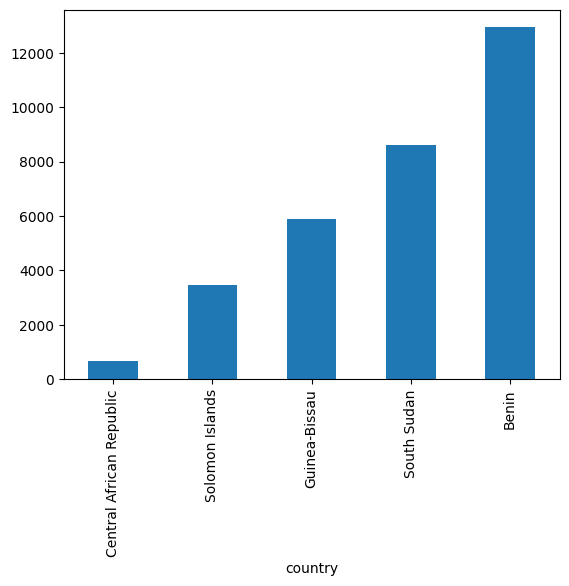

In [82]:
covid_df.groupby(['country'])['total_vaccinations'].last().nsmallest(5).plot(kind='bar')

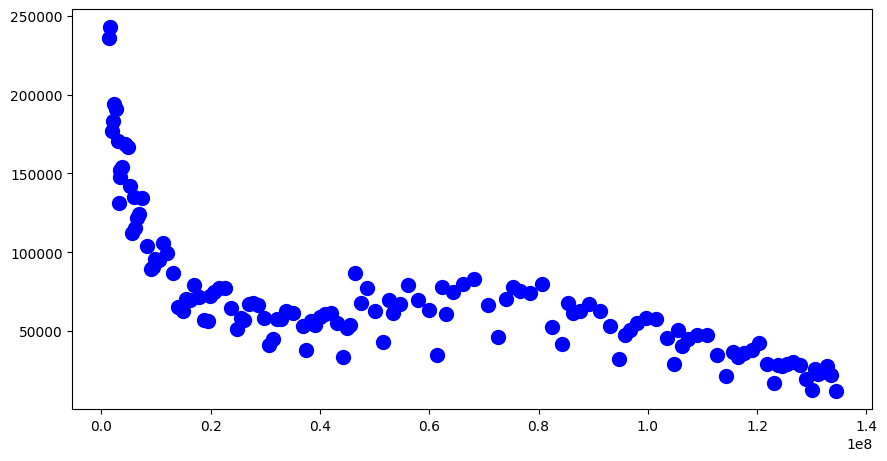

In [83]:
us_data = covid_df[covid_df['country'] == 'United States']

fig = plt.figure(figsize=(8, 4))
axes = fig.add_axes([0, 0, 1, 1])
axes.scatter(
    x=us_data['people_fully_vaccinated'], 
    y=us_data['daily_confirmed'], 
    s=100,
    marker='o',
    c = 'blue'
);

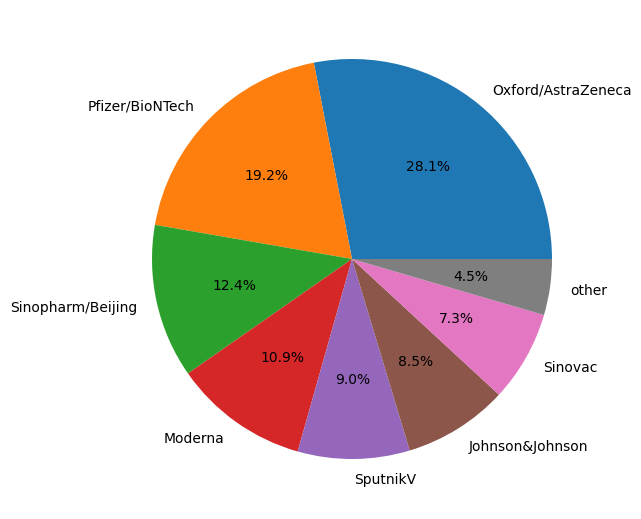

In [84]:
#избавляемся от пропусков в столбце с вакцинами
combination_not_nan = covid_df.dropna(subset=['vaccines'])
#группируем по странам и выбираем последнюю комбинацию вакцин в стране
combination_last = combination_not_nan.groupby(['country'])['vaccines'].last() 
#заменяем пробелы в строках и делим комбинации на отдельные вакцины по запятой
combination_last = combination_last.apply(lambda x: x.replace(' ', '').split(',')) 
#создаём пустой словарь, ключами которого будут вакцины, а значениями — количество стран
vaccines_dict = {} 
#создаём цикл по элементам Series combination_last
for vaccines_list in combination_last:
    #создаём цикл по элементам списка с вакцинами
    for vaccine in vaccines_list:
        #проверяем условие, что текущей вакцины ещё нет среди ключей словаря
        if vaccine not in vaccines_dict:#если условие выполняется
            vaccines_dict[vaccine] = 1 #заносим вакцину в словарь со значением 1
        else: #в противном случае
            vaccines_dict[vaccine] += 1 #увеличивает количество
#преобразуем словарь в Series
vaccines = pd.Series(vaccines_dict).sort_values(ascending=False)
#выделяем ТОП-7 вакцин и добавляем категорию 'other'
vaccines['other'] = vaccines[7:].sum()
vaccines = vaccines.sort_values(ascending=False)[:8]
#строим круговую диаграмму
fig = plt.figure(figsize=(5, 5))
axes = fig.add_axes([0, 0, 1, 1])
axes.pie(
    vaccines,
    labels=vaccines.index,
    autopct='%.1f%%',
);

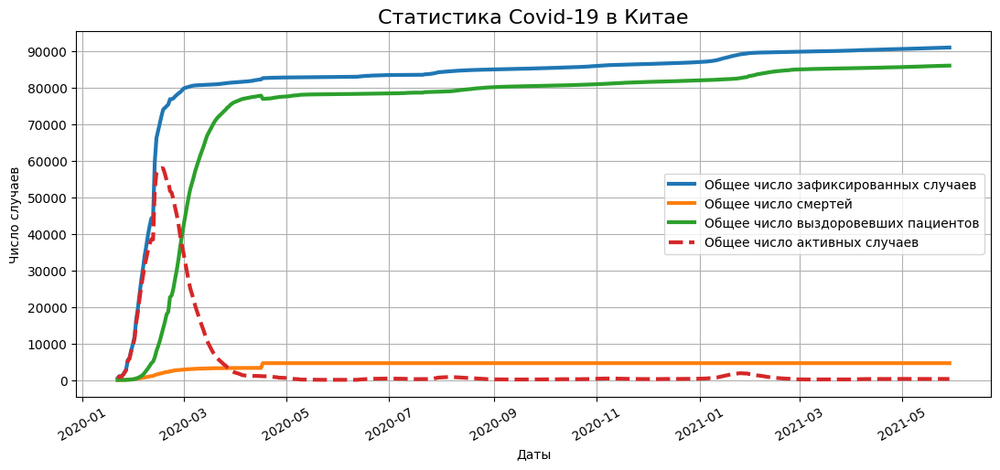

In [85]:
china_data = covid_df[covid_df['country'] == 'China']
china_grouped = china_data.groupby(['date'])[['confirmed', 'active', 'deaths', 'recovered']].sum()

#визуализация графиков
fig = plt.figure(figsize=(10, 4))
axes = fig.add_axes([0, 0, 1, 1])
axes.plot(china_grouped['confirmed'], label='Общее число зафиксированных случаев', lw=3)
axes.plot(china_grouped['deaths'], label='Общее число смертей', lw=3)
axes.plot(china_grouped['recovered'], label='Общее число выздоровевших пациентов', lw=3)
axes.plot(china_grouped['active'], label='Общее число активных случаев', lw=3, linestyle='dashed')

#установка параметров отображения
axes.set_title('Статистика Covid-19 в Китае', fontsize=16)
axes.set_xlabel('Даты')
axes.set_ylabel('Число случаев')
axes.set_yticks(range(0, 100000, 10000))
axes.xaxis.set_tick_params(rotation=30)
axes.grid()
axes.legend();

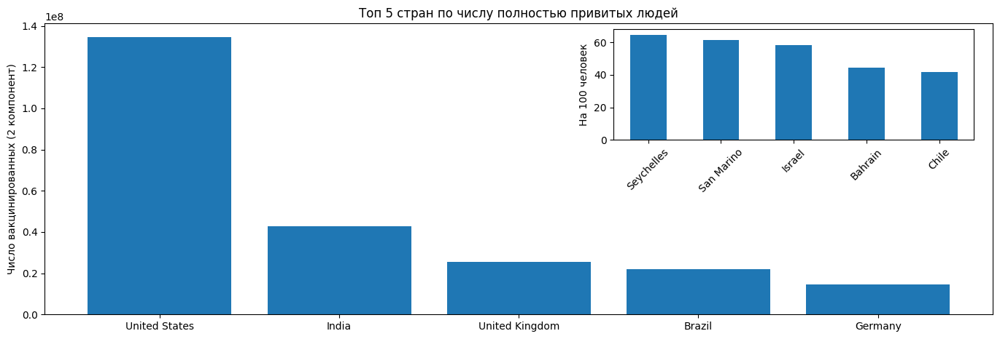

In [86]:
vacc_country = covid_df.groupby('country')['people_fully_vaccinated'].last().nlargest(5)
vacc_country_per_hundred = covid_df.groupby('country')['people_fully_vaccinated_per_hundred'].last().nlargest(5)

#визуализация главного графика
fig = plt.figure(figsize=(13, 4))
main_axes = fig.add_axes([0, 0, 1, 1])
main_axes.bar(x = vacc_country.index, height = vacc_country);
main_axes.set_ylabel('Число вакцинированных (2 компонент)')
main_axes.set_title('Топ 5 стран по числу полностью привитых людей')

#визуализация вспомогательного графика
insert_axes = fig.add_axes([0.6, 0.6, 0.38, 0.38])
insert_axes.bar(x = vacc_country_per_hundred.index, height = vacc_country_per_hundred, width=0.5);
insert_axes.set_ylabel('На 100 человек')
insert_axes.xaxis.set_tick_params(rotation=45)

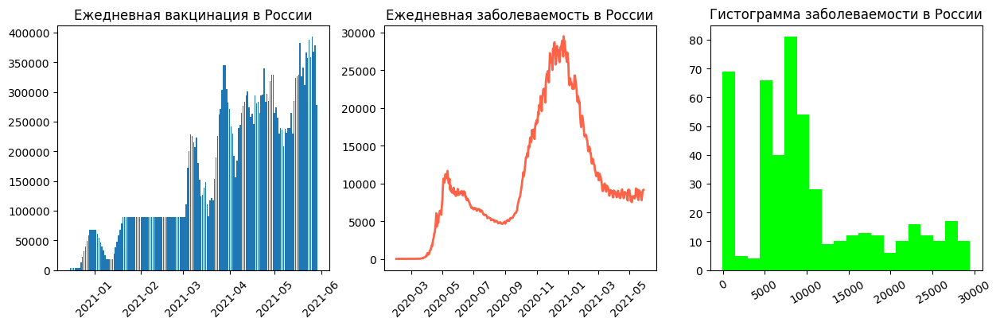

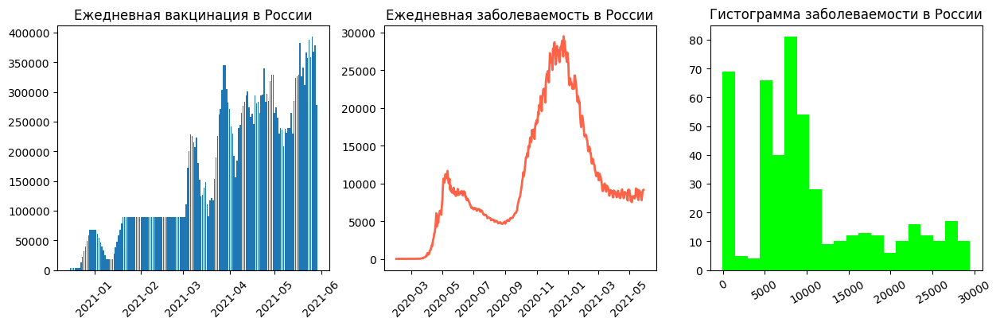

In [87]:
russia_data = covid_df[covid_df["country"] == "Russia"]

# визуализация систем координат
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(15, 4))

# столбчатая диаграмма
axes[0].bar(
    x=russia_data["date"],
    height=russia_data["daily_vaccinations"],
    label="Число вакцинированных",
)
axes[0].set_title("Ежедневная вакцинация в России")
axes[0].xaxis.set_tick_params(rotation=45)

# линейный график
axes[1].plot(
    russia_data["date"],
    russia_data["daily_confirmed"],
    label="Число заболевших",
    color="tomato",
    lw=2,
)
axes[1].set_title("Ежедневная заболеваемость в России")
axes[1].xaxis.set_tick_params(rotation=45)

# гистограмма
axes[2].hist(
    x=russia_data["daily_confirmed"], label=["Число заболевших"], color="lime", bins=20
)
axes[2].set_title("Гистограмма заболеваемости в России")
axes[2].xaxis.set_tick_params(rotation=30)

russia_data = covid_df[covid_df["country"] == "Russia"]

# визуализация систем координат
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(15, 4))

# столбчатая диаграмма
axes[0].bar(
    x=russia_data["date"],
    height=russia_data["daily_vaccinations"],
    label="Число вакцинированных",
)
axes[0].set_title("Ежедневная вакцинация в России")
axes[0].xaxis.set_tick_params(rotation=45)

# линейный график
axes[1].plot(
    russia_data["date"],
    russia_data["daily_confirmed"],
    label="Число заболевших",
    color="tomato",
    lw=2,
)
axes[1].set_title("Ежедневная заболеваемость в России")
axes[1].xaxis.set_tick_params(rotation=45)

# гистограмма
axes[2].hist(
    x=russia_data["daily_confirmed"], label=["Число заболевших"], color="lime", bins=20
)
axes[2].set_title("Гистограмма заболеваемости в России")
axes[2].xaxis.set_tick_params(rotation=30)

In [88]:
print(sns.__version__)

0.13.2


In [89]:
countries = ['Russia', 'Australia', 'Germany', 'Canada', 'United Kingdom']
croped_covid_df = covid_df[covid_df['country'].isin(countries)]

populations = pd.DataFrame([
    ['Canada', 37664517],
    ['Germany', 83721496],
    ['Russia', 145975300],
    ['Australia', 25726900],
    ['United Kingdom', 67802690]
    ],
    columns=['country', 'population']
)
croped_covid_df = croped_covid_df.merge(populations, on=['country'])
croped_covid_df['daily_confirmed_per_hundred'] = croped_covid_df['daily_confirmed'] / croped_covid_df['population'] * 100
croped_covid_df.head()

,date,country,confirmed,deaths,recovered,active,daily_confirmed,daily_deaths,daily_recovered,total_vaccinations,people_vaccinated,people_vaccinated_per_hundred,people_fully_vaccinated,people_fully_vaccinated_per_hundred,daily_vaccinations,vaccines,death_rate,recover_rate,population,daily_confirmed_per_hundred
0,2020-01-23,Australia,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,25726900,NaN
1,2020-01-25,Australia,4.0,0.0,0.0,4.0,4.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,25726900,0.000016
2,2020-01-26,Australia,4.0,0.0,0.0,4.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,25726900,0.000000
3,2020-01-27,Australia,5.0,0.0,0.0,5.0,1.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,25726900,0.000004
4,2020-01-28,Australia,5.0,0.0,0.0,5.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,25726900,0.000000


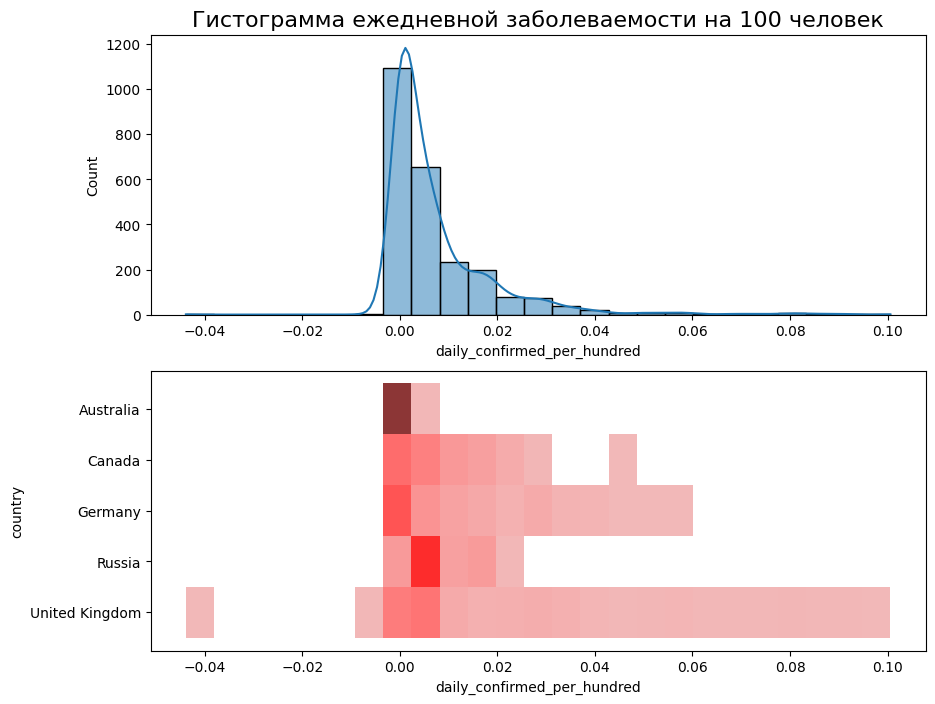

In [90]:
fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(10, 8))
sns.histplot(
    data=croped_covid_df,
    x='daily_confirmed_per_hundred',
    bins=25,
    kde=True,
    ax=axes[0]
);
axes[0].set_title('Гистограмма ежедневной заболеваемости на 100 человек', fontsize=16)
sns.histplot(
    data=croped_covid_df,
    x='daily_confirmed_per_hundred',
    y='country',
    bins=25,
    color='red',
    ax=axes[1]
);

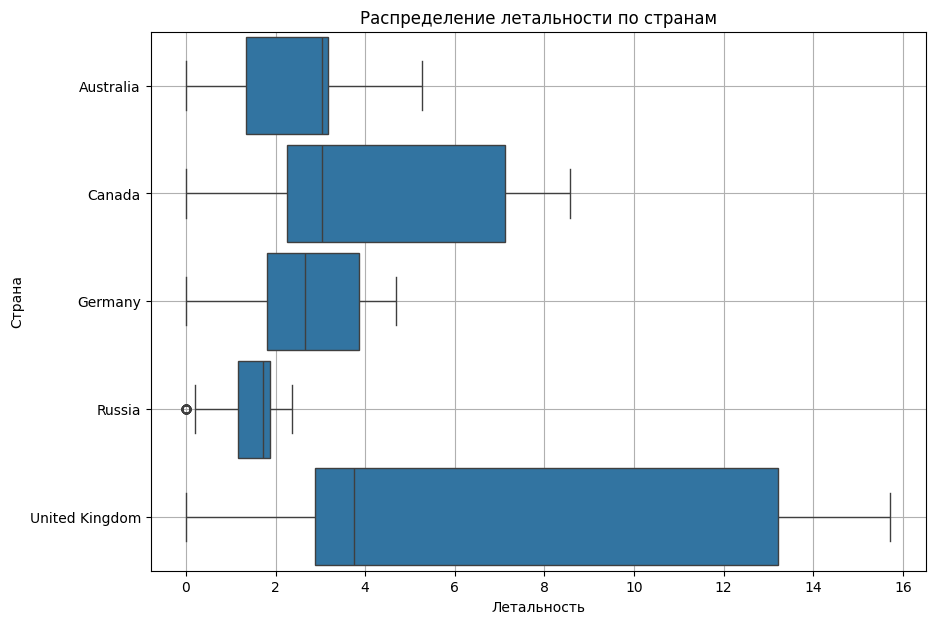

In [91]:
fig = plt.figure(figsize=(10, 7))
boxplot = sns.boxplot(
    data=croped_covid_df,
    y='country',
    x='death_rate',
    orient='h',
    width=0.9
)
boxplot.set_title('Распределение летальности по странам');
boxplot.set_xlabel('Летальность');
boxplot.set_ylabel('Страна');
boxplot.grid()

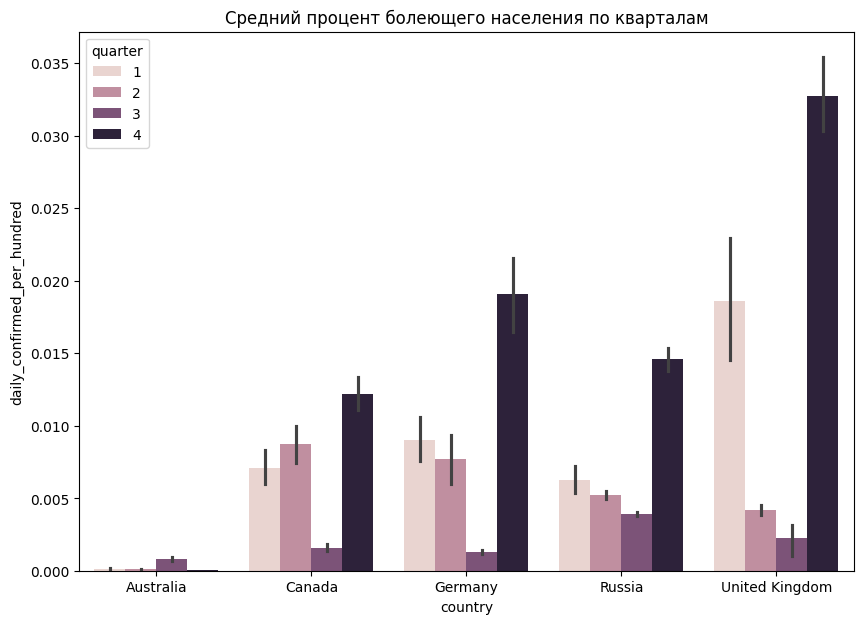

In [92]:
fig = plt.figure(figsize=(10, 7))
croped_covid_df['quarter'] = croped_covid_df['date'].dt.quarter
barplot = sns.barplot(
    data=croped_covid_df,
    x='country',
    y='daily_confirmed_per_hundred',
    hue='quarter',
)
barplot.set_title('Средний процент болеющего населения по кварталам');

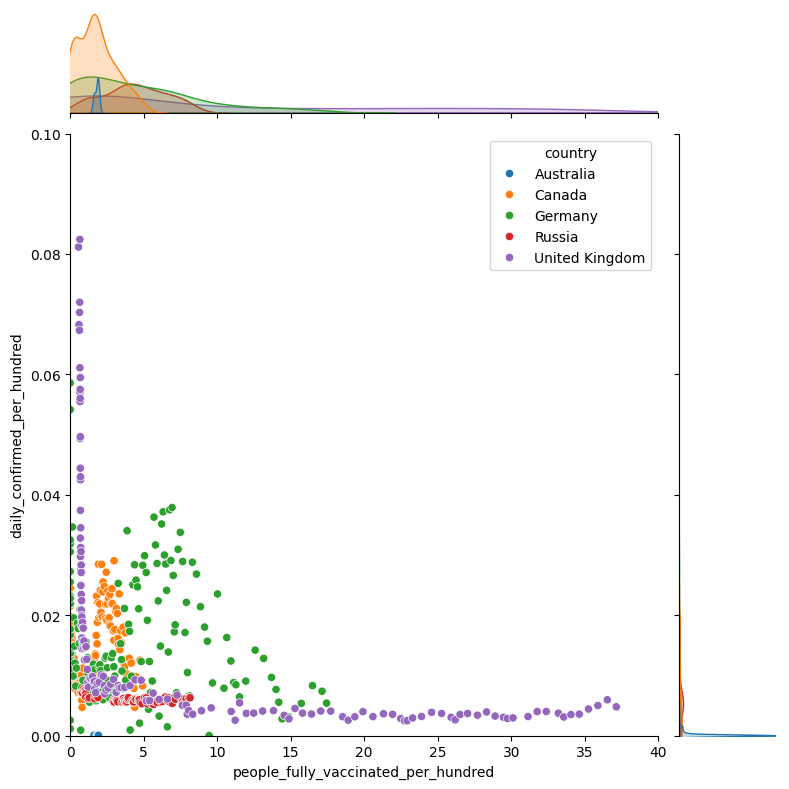

In [93]:
jointplot = sns.jointplot(
    data=croped_covid_df, 
    x='people_fully_vaccinated_per_hundred', 
    y='daily_confirmed_per_hundred',
    hue='country',
    xlim = (0, 40),
    ylim = (0, 0.1),
    height=8,
)

In [94]:
pivot = croped_covid_df.pivot_table(
    values='people_vaccinated_per_hundred',
    columns='date',
    index='country',
)
pivot.columns = pivot.columns.astype('string')
display(pivot)

date,2020-12-13,2020-12-14,2020-12-15,2020-12-16,2020-12-17,2020-12-18,2020-12-19,2020-12-20,2020-12-21,2020-12-22,...,2021-05-20,2021-05-21,2021-05-22,2021-05-23,2021-05-24,2021-05-25,2021-05-26,2021-05-27,2021-05-28,2021-05-29
country,,,,,,,,,,,,,,,,,,,,,
Australia,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,12.40,12.69,12.88,13.28,13.73,14.18
Canada,NaN,0.0,0.00,0.01,0.02,0.03,0.03,0.03,0.05,0.07,...,48.10,49.25,50.14,50.89,51.77,52.39,53.05,53.95,54.99,55.71
Germany,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,39.18,39.68,39.95,40.11,40.29,40.64,41.29,41.87,42.40,42.61
Russia,NaN,NaN,0.02,NaN,NaN,NaN,NaN,NaN,NaN,0.04,...,10.20,10.30,10.50,10.53,10.70,10.81,11.07,11.12,11.19,11.29
United Kingdom,0.13,NaN,NaN,NaN,NaN,NaN,NaN,0.99,NaN,NaN,...,55.01,55.33,55.63,55.82,55.99,56.27,56.61,56.99,57.29,57.56


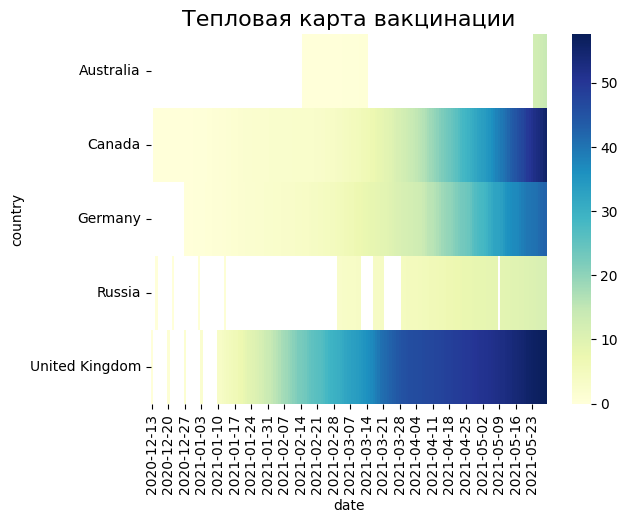

In [95]:
heatmap = sns.heatmap(data=pivot, cmap='YlGnBu')
heatmap.set_title('Тепловая карта вакцинации', fontsize=16);

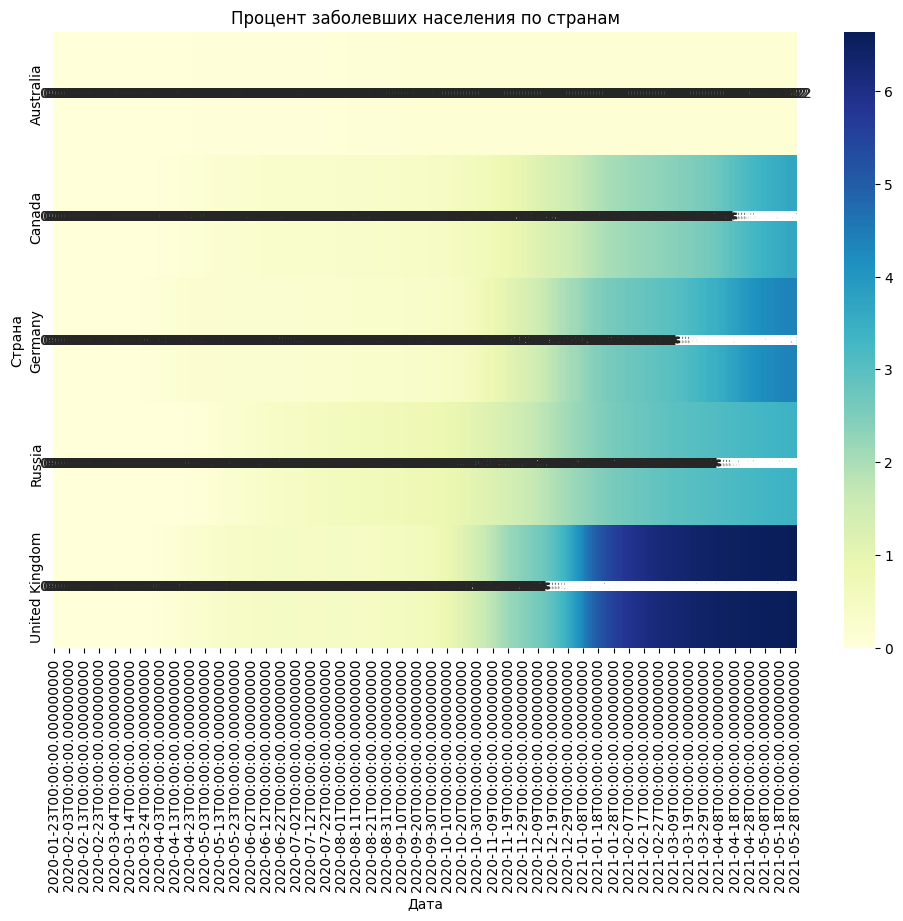

In [96]:
# Шаг 1: Создание нового признака confirmed_per_hundred
croped_covid_df['confirmed_per_hundred'] = (croped_covid_df['confirmed'] / croped_covid_df['population']) * 100

# Шаг 2: Создание сводной таблицы
pivot_table = croped_covid_df.pivot_table(
    index='country',        # строки - страны
    columns='date',        # столбцы - даты
    values='confirmed_per_hundred',  # значения - процент заболевших
    fill_value=0           # заполняем пустые значения нулями
)

# Шаг 3: Построение тепловой карты
plt.figure(figsize=(12, 8))
sns.heatmap(pivot_table, cmap='YlGnBu', annot=True, fmt=".2f")  # annot=True добавляет значения в ячейках
plt.title('Процент заболевших населения по странам')
plt.xlabel('Дата')
plt.ylabel('Страна')
plt.show()

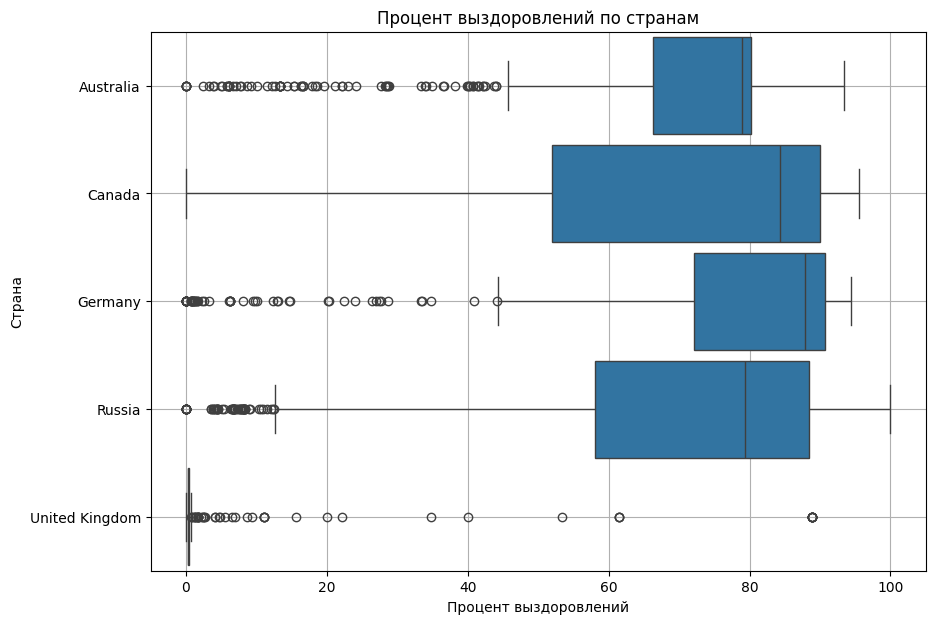

In [97]:
# Создаем фигуру для визуализации
fig = plt.figure(figsize=(10, 7))

# Строим коробчатую диаграмму для recover_rate
boxplot = sns.boxplot(
    data=croped_covid_df,
    y='country',          # Страны по оси Y
    x='recover_rate',     # Процент выздоровевших по оси X
    orient='h',           # Горизонтальная ориентация
    width=0.9             # Ширина коробки
)

# Настраиваем заголовок и метки
boxplot.set_title('Процент выздоровлений по странам')
boxplot.set_xlabel('Процент выздоровлений')
boxplot.set_ylabel('Страна')
palette='Set2'

# Добавляем сетку для удобства восприятия
boxplot.grid()

# Отображаем график
plt.show()

In [98]:
pip install plotly


[notice] A new release of pip is available: 24.2 -> 24.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [99]:
import plotly
import plotly.express as px
print(plotly.__version__)

5.24.1


In [100]:
pip install nbformat --upgrade

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 24.2 -> 24.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [101]:
pip show nbformat

Name: nbformat
Version: 5.10.4
Summary: The Jupyter Notebook format
Home-page: https://jupyter.org
Author: 
Author-email: Jupyter Development Team <jupyter@googlegroups.com>
License: BSD 3-Clause License

- Copyright (c) 2001-2015, IPython Development Team
- Copyright (c) 2015-, Jupyter Development Team

All rights reserved.

Redistribution and use in source and binary forms, with or without
modification, are permitted provided that the following conditions are met:

1. Redistributions of source code must retain the above copyright notice, this
   list of conditions and the following disclaimer.

2. Redistributions in binary form must reproduce the above copyright notice,
   this list of conditions and the following disclaimer in the documentation
   and/or other materials provided with the distribution.

3. Neither the name of the copyright holder nor the names of its
   contributors may be used to endorse or promote products derived from
   this software without specific prior writte

In [102]:
line_data = covid_df.groupby('date', as_index=False).sum()
fig = px.line(
    data_frame=line_data, #DataFrame
    x='date', #ось абсцисс
    y=['confirmed', 'recovered', 'deaths', 'active'], #ось ординат
    height=500, #высота
    width=1000, #ширина
    title='Confirmed, Recovered, Deaths, Active cases over Time' #заголовок
)
fig.show()

In [103]:
#считаем средний процент выздоровлений для каждой страны
bar_data = covid_df.groupby(
    by='country',
    as_index=False
)[['recover_rate']].mean().round(2).nlargest(10, columns=['recover_rate'])

#строим график
fig = px.bar(
    data_frame=bar_data, #датафрейм
    x="country", #ось x
    y="recover_rate", #ось y
    color='country', #расцветка в зависимости от страны
    text = 'recover_rate', #текст на столбцах
    orientation='v', #ориентация графика
    height=500, #высота
    width=1000, #ширина
    title='Top 10 Countries for Recovery Rate' #заголовок
)

#отображаем его
fig.show()

In [104]:
#считаем среднее ежедневно фиксируемое количество выздоровевших по странам
treemap_data = covid_df.groupby(
    by='country',
    as_index=False
)[['daily_recovered']].mean()

#строим график
fig = px.treemap(
    data_frame=treemap_data, #DataFrame
    path=['country'], #категориальный признак, для которого строится график
    values='daily_recovered', #параметр, который сравнивается
    height=500, #высота
    width=1000, #ширина
    title='Daily Recovered Cases by Country' #заголовок
)

#отображаем график
fig.show()

In [105]:
#преобразуем даты в строковый формат
choropleth_data = covid_df.sort_values(by='date')
choropleth_data['date'] = choropleth_data['date'].astype('string')

#строим график
fig = px.choropleth(
    data_frame=choropleth_data, #DataFrame
    locations="country", #столбец с локациями
    locationmode = "country names", #режим сопоставления локаций с базой Plotly
    color="confirmed", #от чего зависит цвет
    animation_frame="date", #анимационный бегунок
    range_color=[0, 30e6], #диапазон цвета
    title='Global Spread of COVID-19', #заголовок
    width=800, #ширина
    height=500, #высота
    color_continuous_scale='Reds' #палитра цветов
)

#отображаем график
fig.show()

In [106]:
#фильтруем таблицу по странам
countries=['United States', 'Russia', 'United Kingdom', 'Brazil', 'France']
scatter_data = covid_df[covid_df['country'].isin(countries)]

#строим график
fig = px.scatter_3d(
    data_frame=scatter_data, #DataFrame
    x = 'daily_confirmed', #ось абсцисс
    y = 'daily_deaths', #ось ординат
    z = 'daily_vaccinations', #ось аппликат
    color='country', #расцветка в зависимости от страны
    log_x=True, 
    log_y=True,
    width=1000,
    height=700
)

#отображаем график
fig.show()
fig.write_html("plotly/scatter_3d.html")

# ***Сохранение графика plotly***

In [107]:
fig.write_html("plotly/scatter_3d.html")

In [108]:
countries=['United States', 'Russia', 'United Kingdom', 'Brazil', 'France']
box_data = covid_df[covid_df['country'].isin(countries)]
fig = px.box(data_frame=box_data, x = 'daily_vaccinations_per_million', color='country')
fig.show()

ValueError: Value of 'x' is not the name of a column in 'data_frame'. Expected one of ['date', 'country', 'confirmed', 'deaths', 'recovered', 'active', 'daily_confirmed', 'daily_deaths', 'daily_recovered', 'total_vaccinations', 'people_vaccinated', 'people_vaccinated_per_hundred', 'people_fully_vaccinated', 'people_fully_vaccinated_per_hundred', 'daily_vaccinations', 'vaccines', 'death_rate', 'recover_rate'] but received: daily_vaccinations_per_million

Рекомендации по использованию популярных типов диаграмм

Навык визуализации предполагает правильный выбор диаграммы и умение её преподнести. Давайте на примерах рассмотрим, как правильно (и неправильно тоже) строить основные виды графиков.

Столбчатая диаграмма

Столбчатая диаграмма (bar plot) — один из самых популярных видов графиков, однако не все исследователи используют его правильно.

→ Столбчатая диаграмма используется, когда необходимо сравнить какой-то показатель (количество, среднее, медиану) в зависимости от категориального признака (возможен вариант сравнения по датам). Это часто помогает понять, каково соотношение категорий, какая категория доминирующая. Всё это можно учитывать при построении модели, чтобы делать прогнозы более точными.

СОВЕТЫ

Не сравнивайте больше десяти категорий друг с другом с помощью столбчатой диаграммы — вам будет сложно ориентироваться в ней, особенно если диаграмма многоуровневая.

Если категорий слишком много, можно использовать иерархическую диаграмму или попробовать отразить диаграмму горизонтально (поменять параметры x и y местами). 

Ещё один вариант — объединить непопулярные категории в общую категорию «другие».

Начало точки отсчёта для значений показателя всегда 0.

Если у вас есть значения меньше 0, используйте горизонтальную столбчатую диаграмму.

→ Линейный график (linear plot) отлично подходит, если набор данных непрерывен (как мы уже видели раньше, обычно это временной ряд). График используется для определения тенденций во временном ряду и сравнения нескольких рядов между собой.

СОВЕТЫ

Не используйте график, если набор данных дискретный (менее 20 наблюдений) — в таком случае лучше воспользуйтесь столбчатой диаграммой.

Время всегда отображается по оси абсцисс и разбивается на равные интервалы.

Если даты сливаются, используйте наклон в 45 градусов.
Не используйте график для сравнения рядов, если их больше 7-10 — график станет нечитабельным. Попробуйте уменьшить число категорий.

Например, если вам необходимо сравнить графики продаж по странам (а их у вас около 200), добавьте признак региона (например, Азия, Европа, Северная Америка и т. д.) и сравнивайте временные ряды в его разрезе. Когда вы выявите лидера по продажам среди регионов, можете вернуться к сравнению стран внутри этого региона.

Гистограмма

→ Гистограммы (histogram) часто применяются для разведывательного анализа данных (EDA), так как они дают информацию о распределении признака. С их помощью можно сразу определить диапазон изменения признака, его модальное значение (пик гистограммы), а также найти «пеньки», которые выбиваются от непрерывного распределения гистограммы, — аномалии.

СОВЕТЫ

Не стоит строить гистограмму, если наблюдений мало — распределение окажется далёким от действительного и вы просто сделаете ложные выводы. По статистике, для того, чтобы гистограмма хоть как-то оценивала истинное распределение, нужно как минимум 30 наблюдений (на практике нужно хотя бы 100).

Попробуйте (ради эксперимента) построить пять-семь гистограмм на одном графике для их сравнения по категориям (например, страны). ⛔ На практике так делать не нужно. Для сравнения параметров распределений по категориям предназначена коробчатая диаграмма (boxplot).

Если вы всё же хотите сравнить гистограммы между собой, предварительно обязательно приведите признаки к одной шкале (мы делали это, когда сравнивали ежедневную заболеваемость коронавирусом в процентах от населения страны). Если этого не сделать, распределения окажутся несопоставимыми.

Например, что значит 1 млн заболевших в день для Китая с населением в 1.5 млрд человек? А что значит такая же цифра для Ватикана, население которого меньше 1 тыс. человек? Вероятно, суть ясна.

После того как вы привели все признаки к одной шкале, лучше используйте цветовую гистограмму, которая показывает частоту интенсивностью цвета (загляните в юнит по Seaborn, если забыли). Да, она не покажет высоту столбцов в цифрах, но зато вы сможете визуально сравнить категории между собой и избежать наложения гистограмм друг на друга.

Диаграмма рассеяния

→ Диаграмма рассеяния (scatter plot) и её производные — jointplot (гистограммы с рассеянием), kdeplot (диаграмма плотностей) и bubble plot (пузырьковая диаграмма) — предназначены для выявления взаимосвязи между двумя (или в случае 3D — тремя) признаками.

Можно добавлять в график расцветку по одному категориальному признаку, а тип или размер маркеров — по другому. Итого мы сможем наблюдать взаимосвязь нескольких признаков (до пяти).

СОВЕТЫ

Не используйте диаграммы рассеяния на маленьком наборе данных. Здесь ситуация та же, что и с гистограммами.

Не стоит использовать расцветку и размер точек для признаков с большим числом уникальных категорий.

В случае если вы не видите зависимостей в данных, попробуйте использовать логарифмическую шкалу по оси абсцисс (по оси абсцисс и ординат в случае 3D-графика). Во всех библиотеках в методе есть параметр log, значение которого нужно установить на True.

?
Почему логарифмическая шкала?

Ответ, конечно же, кроется в математике. Если говорить, не вдаваясь в подробности, функция логарифма, во-первых, отбрасывает отрицательные значения, а во-вторых, «приземляет» более высокие значения — зависимость становится более гладкой, и её становится легче просматривать. При этом логарифмирование не искажает исходную зависимость: то есть если на исходных данных был тренд роста признака А от признака Б, то на логарифмированных данных этот тренд сохранится.

In [ ]:
Диаграмма рассеяния

→ Диаграмма рассеяния (scatter plot) и её производные — jointplot (гистограммы с рассеянием), kdeplot (диаграмма плотностей) и bubble plot (пузырьковая диаграмма) — предназначены для выявления взаимосвязи между двумя (или в случае 3D — тремя) признаками.

Можно добавлять в график расцветку по одному категориальному признаку, а тип или размер маркеров — по другому. Итого мы сможем наблюдать взаимосвязь нескольких признаков (до пяти).

СОВЕТЫ

Не используйте диаграммы рассеяния на маленьком наборе данных. Здесь ситуация та же, что и с гистограммами.

Не стоит использовать расцветку и размер точек для признаков с большим числом уникальных категорий.

В случае если вы не видите зависимостей в данных, попробуйте использовать логарифмическую шкалу по оси абсцисс (по оси абсцисс и ординат в случае 3D-графика). Во всех библиотеках в методе есть параметр log, значение которого нужно установить на True.

?
Почему логарифмическая шкала?

Ответ, конечно же, кроется в математике. Если говорить, не вдаваясь в подробности, функция логарифма, во-первых, отбрасывает отрицательные значения, а во-вторых, «приземляет» более высокие значения — зависимость становится более гладкой, и её становится легче просматривать. При этом логарифмирование не искажает исходную зависимость: то есть если на исходных данных был тренд роста признака А от признака Б, то на логарифмированных данных этот тренд сохранится.

Круговая диаграмма

→ Круговая диаграмма (pie chart) показывает структуру признака, то есть процентную долю каждого из возможных значений признака. 

Вы можете столкнуться с ней, например, когда захотите отобразить соотношение классов в данных или вклад отдельных компонентов в общую прибыль.

СОВЕТЫ

Сумма значений в круге всегда должна равняться единице, то есть всегда должно быть целое и его части (например, отношение числа заболевших вирусом по странам к общему количеству населения).

С помощью круговой диаграммы нельзя сравнить средний чек в ресторанах — эти средние не являются частью единого целого. Однако можно сравнить число сотрудников в этих ресторанах, так как они являются частью одной совокупности.

Не визуализируйте секторы, близкие к 0, — их невозможно сравнить друг с другом.

Не делайте больше 6-8 секторов — воспринимать информацию будет сложно. Если компонентов больше, выделите ТОП-6-8, а остальные обозначьте как «прочие».

Всегда отображайте легенду либо подписи категорий внутри секторов.
Если важно выделить часть графика, «вытащите» его из центра.

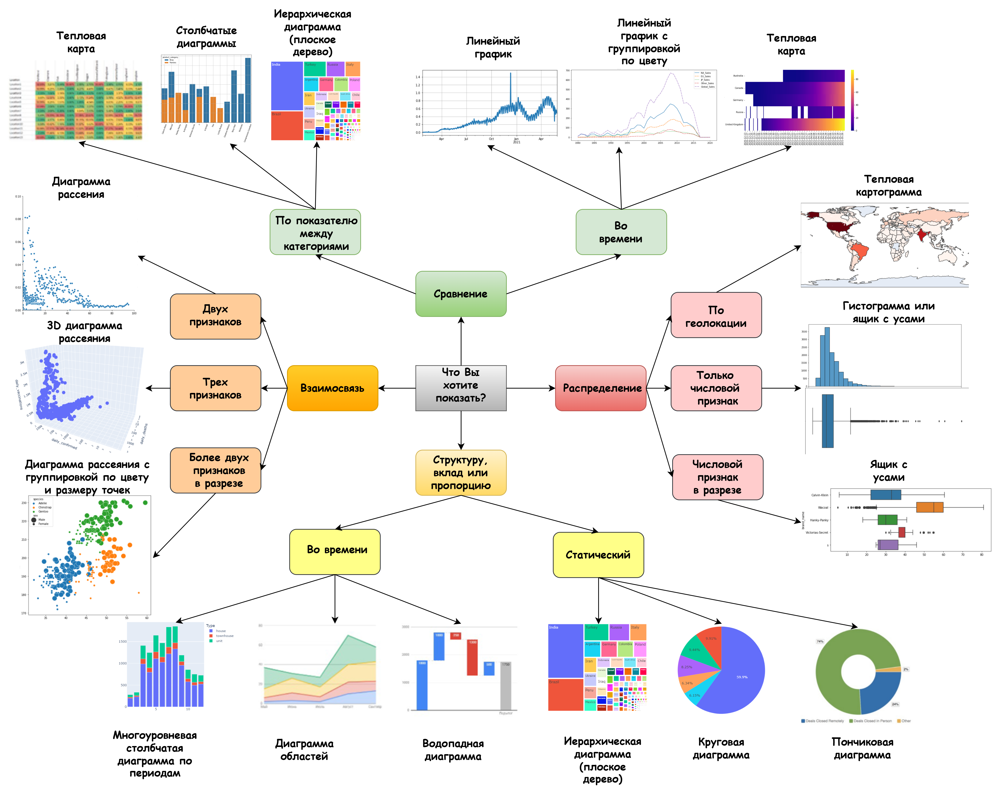